In [1]:
%matplotlib inline
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
from astropy.io import fits
import richardsplot
import pandas as pd
#from densityplot import *

In [2]:
def figsize(hscale, 
            vscale=(np.sqrt(5.0)-1.0)/2.0,
            fig_width_pt = 336.0):
   

    """
    Get the fig_width_pt by inserting \the\textwidth into LaTeX document.

    hscale is fraction of text width you want.

    vscale is fraction of hscale (defaults to golden ratio)  
    """
   
    inches_per_pt = 1.0/72.27                       # Convert pt to inch
    fig_width = fig_width_pt*inches_per_pt*hscale   # width in inches
    fig_height = fig_width*vscale                   # height in inches
    fig_size = [fig_width, fig_height]

    return fig_size

In [3]:
import palettable

pgf_with_latex = {                      # setup matplotlib to use latex for output
    "axes.linewidth":1.5,               # width of box, 2 is too wide, 1 is too narrow
    "pgf.texsystem": "pdflatex",        # change this if using xetex or lautex
    "text.usetex": True,                # use LaTeX to write all text
    "font.family": "serif",
    "font.serif": [],                   # blank entries should cause plots to inherit fonts from the document
    "font.sans-serif": [],
    "font.monospace": [],
    "axes.labelsize": 16,               # LaTeX default is 10pt font, font size of axis text label
    "axes.labelpad" : 6,                # Distance between label and axis
    "axes.formatter.limits":[-5, 5],    # use sci notation if log10 of axis range is smaller than first or larger than second 
    "axes.formatter.useoffset":False,
    "font.size": 16,
    "legend.fontsize": 12,              # Make the legend/label fonts a little smaller
    "xtick.labelsize": 16,              # Font size of numbers 
    "ytick.labelsize": 16,
    'xtick.major.width':1, 
    'xtick.minor.width':1, 
    'ytick.major.width':1, 
    'ytick.minor.width':1, 
    'xtick.major.size':10,             # size of tickmarks in points
    'xtick.minor.size':5, 
    'ytick.major.size':10, 
    'ytick.minor.size':5,
    'xtick.major.pad':8,               # distance between box and numbers
    'ytick.major.pad':8,
    'xtick.direction':'in',
    'ytick.direction':'in',
    'figure.autolayout': True,
    "figure.figsize": figsize(1,1),     # default fig size of 0.9 textwidth
    "pgf.preamble": [
        r"\usepackage[utf8x]{inputenc}",    # use utf8 fonts becasue your computer can handle it
        r"\usepackage[T1]{fontenc}",        # plots will be generated using this preamble
        ]
    }

mpl.rcParams.update(pgf_with_latex)


csdark = palettable.colorbrewer.qualitative.Dark2_5.mpl_colors
cspurple = palettable.colorbrewer.sequential.BuPu_4.mpl_colors
csorange = palettable.colorbrewer.sequential.YlOrBr_5.mpl_colors


In [4]:
#import pandas as pd
#Load the ICA weights from Paul's 6-component fitting (now for DR7)
infile = 'grdr7_180126.weights'
infoHewett = pd.read_csv(infile, sep = ' ', names=["name", "redshift", "W1", "W2", "W3", "W4", "W5", "W6", "detection", "uniform"]) #added detection for bokeh plot
infile1 = 'grdr7.radec'
infoCoords = pd.read_csv(infile1, sep = ' ', names=["name", "RA", "Dec"])

In [5]:
infile3 = 'grdr7_Shen2011_targ_uni.csv'
infoShen = pd.read_csv(infile3, skiprows=1, names=["name","RAx","DECx","SDSSNAME","RA","DEC","redshift","TARG_FLAG","UNI_FLAG","COLOR_FLAG","MIZ2","BALFLAGShen","FIRSTFRTYPE","FINTREST6CM","LOGFNU2500","R6CM2500A","LOGL3000","LOGL1350","Separation", "DETECTION"])

In [6]:
#Mask to pick out color-selected objects (ignores radio selected and NaN [non-DR7 objects])
cMask = np.array(infoShen['COLOR_FLAG'])

#This mask picks out our detections
dMask = np.array(infoShen['DETECTION'])

In [7]:
#Need to format weights for Scikit-Learn
weights = infoHewett[infoHewett.columns[2:]]
#print weights
X = np.array(weights)
#print(X)

wt_dMask = np.array(infoHewett["detection"]) #targets ordered in infoHewett -- inserted manually
wt_uniMask = np.array(infoHewett["uniform"]) #uniform flag for targets only

wt_dX = X[wt_dMask==1] #find detection entries
wt_dX = wt_dX[:,:6] #reformat weights (eliminate detection column)
    
# Array of each of the 6 weights
W1 = X[:,0]
W2 = X[:,1]
W3 = X[:,2]
W4 = X[:,3]
W5 = X[:,4]
W6 = X[:,5]

W0 = X[:,0]+X[:,1]+X[:,2]+X[:,3]

In [8]:
#We are going to want to restrict the redshift range, do it like this.
zem = np.array(infoHewett['redshift'])

# Number with z<1.75
zmask = ((zem<=1.75))
print (len(infoHewett[zmask]), len(infoHewett))
print (len(X[zmask]))
print (zem)

2329 8653
2329
[1.779394 1.882529 1.668503 ... 1.717688 1.997207 1.65575 ]


In [9]:
projTSNE2 = np.load('projTSNE2.npy') #load in saved TSNE projection of weights -- preserves orientations 
                                     # so we can carry out analysis in multiple notebooks

In [10]:
dproj = projTSNE2[wt_dMask==1] #organize coordinates to match d/nd in bokeh plot
ndproj = projTSNE2[wt_dMask==-1]
all_data_proj = projTSNE2[abs(wt_dMask)==1]

In [11]:
print(projTSNE2)
print(np.shape(projTSNE2))

[[-10.431032  22.933214]
 [ 21.105062  22.579042]
 [ 11.070066  74.19891 ]
 ...
 [ 13.285895  58.900265]
 [-13.282213  39.57284 ]
 [ 69.70515  -12.805232]]
(8653, 2)


In [12]:
#Output tSNE projections to file
#infile1 = 'grdr7.radec'
#infoCoords = pd.read_csv(infile1, sep = ' ', names=["name", "RA", "Dec"])

df = pd.DataFrame({'Name':infoCoords['name'],'RA':infoCoords['RA'],'Dec':infoCoords['Dec'], 'Proj1':projTSNE2[:,0], 'Proj2':-1.0*projTSNE2[:,1]})
#df.to_csv('grdr7.radec.projTSNE.csv')

In [13]:
#Read in radio data
R = np.array(infoShen['R6CM2500A']).astype(float)
FIRST = np.array(infoShen['FINTREST6CM']).astype(float)

In [14]:
#Radio-loud mask
RLmask = (R>10)

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in greater
  


In [15]:
projTSNE2rad = projTSNE2[RLmask]
print (len(projTSNE2), len(projTSNE2rad))

8653 519


In [16]:
#We are going to want to restrict the redshift range, do it like this.
zem = np.array(infoHewett['redshift'])

# Number with 1.55<z.1.75
#zmask = ((zem>1.65)&(zem<=1.658))
zmask = ((zem>1.645)&(zem<=1.6519))
print (len(infoHewett[zmask]), len(infoHewett))
print (len(X[zmask]))

print (infoHewett[zmask])

50 8653
50
                         name  redshift       W1       W2       W3       W4  \
22    SDSSJ104852.52+003230.0  1.650584  0.04427  0.00762  0.02254  0.02966   
113   SDSSJ113548.66-022617.8  1.650240  0.02296  0.02971  0.02039  0.02975   
214   SDSSJ215800.38+002724.2  1.650432  0.04607  0.01364  0.01134  0.03426   
233   SDSSJ001342.45-002412.6  1.650561  0.02732  0.02415  0.02630  0.01611   
293   SDSSJ014023.83+141151.7  1.650361  0.01581  0.04727  0.00394  0.03844   
653   SDSSJ105814.69+015230.6  1.651886  0.01892  0.03231  0.01612  0.04751   
677   SDSSJ114408.55+020221.2  1.650603  0.06337  0.00244  0.01351  0.00486   
1021  SDSSJ120845.22+653344.6  1.651211  0.02340  0.02925  0.02029  0.02997   
1204  SDSSJ235321.03-085930.6  1.650869  0.02344  0.02970  0.02141  0.02401   
1270  SDSSJ014658.21-091505.2  1.650855  0.02277  0.03147  0.02065  0.02196   
1281  SDSSJ015720.27-093809.1  1.650784  0.03413  0.02012  0.01647  0.03683   
1375  SDSSJ213109.57+104714.2  1.651736  

Two of these 50 are FIRST sources, 4 are BALs.

235321.03-085930.6 and 101946.98+494848.6 are the FIRST sources

50


/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))
/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))
/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2366: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


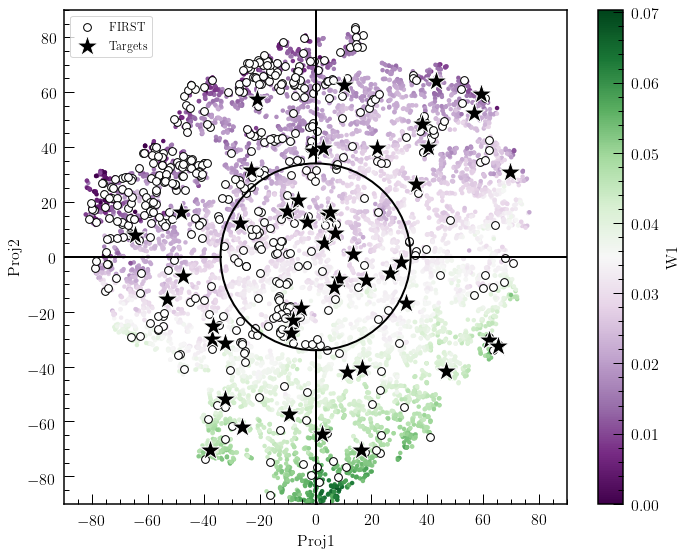

In [17]:
# Find radius of circle containing 20% of the sources and plot
x0 = 0 #take center of circle to be 0,0
y0 = 0
x  = projTSNE2[:,0]
y  = projTSNE2[:,1]
# Find radial coordinate of each point
r  = np.sqrt((x - x0)**2 + (y - y0)**2)
t  = 20 # percent
# Find radius that corresponds to t percentile
r0 = np.percentile(r, t)

plot = plt.figure(figsize=(10,8))

projTSNE2col = projTSNE2[cMask>0]
projTSNE2radcol = projTSNE2[(cMask>0)&(RLmask)]
projTSNE2colz = projTSNE2[(cMask>0)&(zmask)]
print (len(projTSNE2colz))

plt.scatter(projTSNE2col[:,0], projTSNE2col[:,1], c=W1[cMask>0], cmap="PRGn", edgecolor="None", s=20)
plt.xlabel("Proj1")
plt.ylabel("Proj2")
cbar = plt.colorbar()
cbar.ax.set_ylabel('W1')
plt.scatter(projTSNE2radcol[:,0], projTSNE2radcol[:,1], c='w', edgecolor='k', s=60, label="FIRST")
plt.scatter(projTSNE2colz[:,0], projTSNE2colz[:,1], c='k', edgecolor='w', s=500, marker='*', label="Targets")
plt.xlabel("Proj1")
plt.xlim(-90,90)
plt.ylim(-90,90)
plt.legend(loc="upper left")

circle=plt.Circle((0, 0), r0, color='k', fill=False, linewidth=2)
fig = plt.gcf()
fig.gca().add_artist(circle)

plt.plot([0,0], [r0,100], c='k', linewidth=2)
plt.plot([0,0], [-r0,-100], c='k', linewidth=2)
plt.plot([r0,100], [0,0], c='k', linewidth=2)
plt.plot([-r0,-100], [0,0], c='k', linewidth=2)
#plt.savefig('newPGtargets.pdf')

In [20]:
np.argmin(x[zmask])

15

targets uniformly span spectral phase space

In [21]:
def make_sameName(i): #remove necessary characters to match image formatting (only to arcsec, remove SDSS) -- elim J as well : 8/23
    
    i = list(i)
    i.pop(0)
    i.pop(0)
    i.pop(0)
    i.pop(0)
    i.pop(0)
    i.pop(4)
    i.pop(4)
    i.pop(4)
    i.pop(4)
    i.pop(4)
    i.pop(9)
    i.pop(9)
    i.pop(9)
    i.pop(9)

    i = ''.join(i)

    return i


Create Interactive Bokeh Plot of Data Above:

J1019+4948 is labelled as a target in this but was not observed (not in OPT)

In [31]:
infoTrevor = pd.read_csv('../SpringFinalFigs_moreParams.csv')
infoTrevor.sort_values('col1', inplace=True)

dMask = infoTrevor[["detection"]].values.flatten()
uniMask = infoTrevor[["UNI_FLAG"]].values.flatten()

pfs = infoTrevor[['peak_flux']].values.flatten() #measured peak/integrated flux densities of targets
ifs = infoTrevor[['int_flux']].values.flatten() #3*rms in peak flux column for non-detections

----
#### Details of Bokeh plot below

In [32]:
import bokeh.palettes as pal
from bokeh.plotting import figure, ColumnDataSource, output_file, show, output_notebook
from bokeh.models import HoverTool, markers, glyphs, LinearColorMapper, ColorBar

In [33]:
palette = pal.brewer['PRGn'][11] #want to use this palette to mimic color gradient from PGv2_DR7
W1pal = []
for i in range(1, len(palette)+1): W1pal.append(palette[-i]) #invert colormap
    
color_mapper = LinearColorMapper(palette=W1pal, low=0.00, high=0.07)

Create data source for bokeh plot

In [34]:
#Create data source and hover tool for Bokeh plot
a = 50/15 - 1  #limiting factors to take account for MUCH brighter FIRST sources in our sample
b = np.log(a)/160
c = 50


target_names = infoTrevor[['name']].values.flatten()
target_names = [make_sameName(x) for x in target_names] #create list with new names titled JXXXX+XXXX

colors = ['#696969', '#e66101'] #colors for [non-detections, detections]
col = []
for i in range(len(dMask)): col.append(colors[int(dMask[i])])

target_source = ColumnDataSource(data=dict(  #create source for detections
    
    x = all_data_proj[:,0], 
    y = all_data_proj[:,1], 
    obs = target_names,
    imgs_4p5am = [('bokeh_imgs/4p5am/' + name + '_4p5am.png') for name in target_names], 
    imgs_90as = [('bokeh_imgs/90as/' + name + '_90as.png') for name in target_names],
    pf = pfs,
    intf = ifs,
    sz = [((c / (1+a*np.e**(-b*x)))) for x in pfs],
    fill = uniMask,
    color = col
    #VOFF_CIV_PEAK = voffs[dMask==1],
    #EW_CIV = ews[dMask==1]
))

In [35]:
print(target_names)

['1048+0032', '1135-0226', '2158+0027', '0013-0024', '0140+1411', '1058+0152', '1144+0202', '1208+6533', '2353-0859', '0146-0915', '0157-0938', '2131+1047', '1241+6246', '1514+5446', '1630+4111', '0829+4016', '1720+2847', '1019+4948', '1537+4815', '1445+5245', '1222+4141', '1305+4624', '1600+3027', '0824+2606', '1302+1300', '1338+0846', '1353+0718', '1509+0756', '1443+3056', '1449+3110', '0823+2139', '0929+3002', '0929+2705', '1100+3150', '1040+3626', '1322+3248', '1406+2923', '1546+1914', '1107+2708', '1217+2943', '0905+1545', '1130+1903', '1132+1726', '1007+1628', '1135+0014', '1200+0005', '2346-0029', '0816+4924', '0956+5347', '1535+5402']


And make the corresponding hover tool to view images -- it needs a custom html tooltip -- copy this template to use in a similar plot

In [36]:
hover = HoverTool(names = ["VLA"], tooltips='''
    <div>
        <div>
            <img
                src="@imgs_4p5am" height="250" alt="@imgs_4p5am" width="250"
                style="float: left; margin: 0px 15px 15px 0px;"
                border="2"
            ></img>
            
            <img       
                src="@imgs_90as" height="250" alt="@imgs_90as" width="250"
                style="float: left; margin: 0px 15px 15px 0px;"
                border="2"
            ></img>
        </div> 
          
        <div>
            <span style="font-size: 17px; font-weight: bold;">@obs</span>
            <span style="font-size: 15px; color: #966;">[$index]</span>
        </div>
        
        <div>
            <span style="font-size: 16px; font-weight: bold;">Peak Flux (uJy/beam) =</span>
            <span style="font-size: 13px; color: #966;">@pf</span>
        </div>
        
        <div>
            <span style="font-size: 16px; font-weight: bold;">Integrated Flux (uJy) =</span>
            <span style="font-size: 13px; color: #966;">@intf</span>
        </div>
        
        <div>
            <span style="font-size: 15px;">Location</span>
            <span style="font-size: 10px; color: #696;">($x, $y)</span>
        </div>
        
    </div>


                      ''')

Make bokeh plot -- *every* bokeh model consists of a *freshly generated* set of bokeh objects which can not be used in another data source.  This basically means that you could easily run into a runtime error when trying to run the following cell over and over again.  An easy fix is simply restarting the kernel.  A good guideline when plotting is avoid using global variables inside 'ColumnDataSource'

In [37]:
output_file('interactive_VLA2018b_size_and_uniform.html')
output_notebook()

cmap = pal.brewer['PRGn'][11] 
sf = 11/.075 #scale position in color map to fit an index

p = figure(plot_width=1000, plot_height=1000, title="",
           x_range=[-100, 100], y_range = [-100, 100], tools=[hover, 'pan,box_zoom,wheel_zoom,save,reset,help'])


W1_cMask = W1[cMask>0]
for i in range(len(W1_cMask)): #loop through each weight and determine color based on weight
    p.circle(projTSNE2col[i,0], projTSNE2col[i,1], color=cmap[10-int(W1_cMask[i]*sf)], name = "Background") #plot background sources (cmap inverted to match original)

p.circle(projTSNE2radcol[:,0], projTSNE2radcol[:,1], line_color = 'black', fill_color = 'white', 
         size = 12, legend = 'FIRST') #FIRST sources



p.diamond_cross(x='x', y='y', color = 'color', size = 'sz', fill_alpha = 'fill',
                source=target_source, name = "VLA") #VLA Targets




p.diamond_cross(x=500, y=500, color='#e66101', legend="Detections")
p.diamond_cross(x=500, y=500, color='#e66101', fill_alpha=0, legend="Detections, Non-Uniform")
p.diamond_cross(x=500, y=500, color='#696969', legend="Non-Detections")
p.diamond_cross(x=500, y=500, color='#696969', fill_alpha=0, legend="Non-Detections, Non-Uniform")


p.circle(x=0, y=0, fill_alpha=0, size=325, line_color='black')
p.line(x=[0,0], y=[r0,100], color='black', line_width=2)
p.line(x=[0,0], y=[-r0,-100], color='black', line_width=2)
p.line(x=[r0,100], y=[0,0], color='black', line_width=2)
p.line(x=[-r0,-100], y=[0,0], color='black', line_width=2)

p.legend.location = 'top_right'
p.legend.click_policy= 'hide'
p.legend.border_line_color = 'navy'
p.legend.border_line_alpha = 0.5
p.legend.background_fill_alpha = 0.5

p.xaxis.axis_label = 'Proj1'
p.yaxis.axis_label = 'Proj2'


show(p)

Loading BokehJS ...